In [1]:
# import necessary libraries

import regex
import re
import pandas as pd
import numpy as np
import emoji
from collections import Counter
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
%matplotlib inline

In [2]:
# check if the data is in Time Format
def startsWithDateAndTime(s):
    pattern = '^([0-9]+)(\/)([0-9]+)(\/)([0-9]+), ([0-9]+):([0-9]+)[ ]?(AM|PM|am|pm)? -' 
    result = re.match(pattern, s)
    if result:
        return True
    return False

In [3]:
# check for Author
def FindAuthor(s):
  s=s.split(":")
  if len(s)==2:
    return True
  else:
    return False

In [4]:
def getDataPoint(line):   
    splitLine = line.split(' - ') 
    dateTime = splitLine[0]
    date, time = dateTime.split(', ') 
    message = ' '.join(splitLine[1:])
    if FindAuthor(message): 
        splitMessage = message.split(': ') 
        author = splitMessage[0] 
        message = ' '.join(splitMessage[1:])
    else:
        author = None
    return date, time, author, message

In [5]:
data = [] 
parsedData = []
conversation = "data/chat.txt"
with open(conversation, encoding="utf-8") as fp:
    fp.readline()
    messageBuffer = [] 
    date, time, author = None, None, None
    while True:
        line = fp.readline() 
        if not line: 
            break
        line = line.strip() 
        if startsWithDateAndTime(line): 
            if len(messageBuffer) > 0: 
                parsedData.append([date, time, author, ' '.join(messageBuffer)]) 
            messageBuffer.clear() 
            date, time, author, message = getDataPoint(line) 
            messageBuffer.append(message) 
        else:
            messageBuffer.append(line)

In [6]:
df = pd.DataFrame(parsedData, columns=['Date', 'Time', 'Author', 'Message'])
df["Date"] = pd.to_datetime(df["Date"])
df['Time'] = pd.to_datetime(df['Time'], format = '%I:%M %p')
df["Day"]= pd.to_datetime(df['Date']).dt.day_name()

In [7]:
total_messages = len(df)

In [8]:
media_messages = df[df['Message'] == '<Media omitted>'].shape[0]
def split_count(text):

    emoji_list = []
    data = regex.findall(r'\X', text)
    for word in data:
        if any(char in emoji.UNICODE_EMOJI for char in word):
            emoji_list.append(word)

    return emoji_list

df["emoji"] = df["Message"].apply(split_count)
emojis = sum(df['emoji'].str.len())
URLPATTERN = r'(https?://\S+)'
df['urlcount'] = df.Message.apply(lambda x: re.findall(URLPATTERN, x)).str.len()
links = np.sum(df.urlcount)
print("WhatApp Chat Details : ")
print("Messages:",total_messages)
print("Media:",media_messages)
print("Emojis:",emojis)
print("Links:",links)

Chat Details : 
Messages: 12462
Media: 1384
Emojis: 6733
Links: 340


In [9]:
unique_na = list(df.Author.unique())
for i in [None,'+91 96342 24579']:
    unique_na.remove(i)

In [10]:
for i in df[df['urlcount'] > 0].index:
    if df['Author'][i] not in unique_na:
        df['Author'][i] = df['Message'].str.split(':')[i][0]
        df['Message'][i] = df['Message'].str.split(':')[i][1]
        df['Message'][i] = " ".join(df['Message'][i])

In [11]:
df.fillna("",inplace=True)

In [12]:
for i in df[df.Author == ""].index:
    if ':' in df['Message'][i]:
        df['Author'][i] = df['Message'].str.split(':')[i][0]

In [13]:
df['Author'] = df['Author'].replace(['Prateek Baruah','Aarif Md.','Jai_SMIT','Abdul SMIT','Agamya Jha',
                                     'Utkarsh Kesarvani','~/nil','Prakhar Tripathi'],
                                    ['Prateek','Aarif','Jai','Abdul','Agamya','Utkarsh','Niladri','Prakhar'])
df.tail(10)

,Date,Time,Author,Message,Day,emoji,urlcount
12452,2020-04-11,1900-01-01 14:05:00,Prateek,I know,Saturday,[],0
12453,2020-04-11,1900-01-01 14:09:00,Smarika,Pandya kon hai?,Saturday,[],0
12454,2020-04-11,1900-01-01 14:13:00,Subhankar,Arn??? Ani?? Kittu?,Saturday,[],0
12455,2020-04-11,1900-01-01 14:14:00,Agamya,Oh bc woh toh hatana hi bhool gaya,Saturday,[],0
12456,2020-04-11,1900-01-01 14:14:00,Agamya,🙈,Saturday,[🙈],0
12457,2020-04-11,1900-01-01 14:16:00,Smarika,🤣🤣,Saturday,"[🤣, 🤣]",0
12458,2020-04-11,1900-01-01 14:17:00,Prateek,Nope,Saturday,[],0
12459,2020-04-11,1900-01-01 14:17:00,Prateek,Think of a whimsical person,Saturday,[],0
12460,2020-04-11,1900-01-01 14:17:00,Smarika,Arif,Saturday,[],0
12461,2020-04-11,1900-01-01 14:17:00,Prateek,Yuss,Saturday,[],0


In [14]:
df = df[df.Message != 'tweet']
df = df[df.Message != 'Tweet']

In [15]:
df = df[df.Author != '']

In [16]:
unique_names = [x for x in df.Author.unique()]

In [17]:
unique_names.remove()

In [18]:
unique_names

['Prateek',
 'Gurjot',
 'Aarif',
 'Jai',
 'Smarika',
 'Abdul',
 'Agamya',
 'Utkarsh',
 'Subhankar',
 'Sarthak',
 'Niladri',
 'Aman',
 'Prakhar']

In [19]:
data = {'author': [],'msg_sent':  [],'words_per_msg': [],'media_msg': [],'emoji_sent': [],'links_sent': [],
        'early_morning_msg': [],'morning_msg': [],'noon_msg': [],'evening_msg': [],'night_msg': [],'sunday': [],
        'monday': [],'tuesday': [],'wednesday': [],'thursday': [],'friday': [],'saturday': [], 'deleted_msg': [], 'del_prop': []}
media_messages_df = df[df['Message'] == '<Media omitted>']
messages_df = df.drop(media_messages_df.index)
messages_df['Letter_Count'] = messages_df['Message'].apply(lambda s : len(s))
messages_df['Word_Count'] = messages_df['Message'].apply(lambda s : len(s.split(' ')))
messages_df["MessageCount"]=1

l = unique_names
for i in range(len(l)):
    
    # Filtering out messages of particular user
    req_df= messages_df[messages_df["Author"] == l[i]]
    data['author'].append(l[i])
    # req_df will contain messages of only one particular user
    
    # shape will print number of rows which indirectly means the number of messages
    data['msg_sent'].append(req_df.shape[0])
    
    #Word_Count contains of total words in one message. Sum of all words/ Total Messages will yield words per message
    words_per_message = (np.sum(req_df['Word_Count']))/req_df.shape[0]
    data['words_per_msg'].append(words_per_message)
    
    #media conists of media messages
    media = media_messages_df[media_messages_df['Author'] == l[i]].shape[0]
    data['media_msg'].append(media)
    
    # emojis conists of total emojis
    emojis = sum(req_df['emoji'].str.len())
    data['emoji_sent'].append(emojis)
    
    #links consist of total links
    linksed = sum(req_df["urlcount"])   
    data['links_sent'].append(linksed)
    
    data['early_morning_msg'].append(len(df[(df.Author == unique_names[i]) & (df.Time.dt.hour >= 0) & (df.Time.dt.hour < 7)]))
    data['morning_msg'].append(len(df[(df.Author == unique_names[i]) & (df.Time.dt.hour >= 7) & (df.Time.dt.hour < 12)]))
    data['noon_msg'].append(len(df[(df.Author == unique_names[i]) & (df.Time.dt.hour >= 12) & (df.Time.dt.hour < 15)]))
    data['evening_msg'].append(len(df[(df.Author == unique_names[i]) & (df.Time.dt.hour >= 17) & (df.Time.dt.hour < 19)]))
    data['night_msg'].append(len(df[(df.Author == unique_names[i]) & (df.Time.dt.hour >= 19) & (df.Time.dt.hour < 24)]))
    
    data['sunday'].append(len(df[(df.Author == unique_names[i]) & (df.Day == 'Sunday')]))
    data['monday'].append(len(df[(df.Author == unique_names[i]) & (df.Day == 'Monday')]))
    data['tuesday'].append(len(df[(df.Author == unique_names[i]) & (df.Day == 'Tuesday')]))
    data['wednesday'].append(len(df[(df.Author == unique_names[i]) & (df.Day == 'Wednesday')]))
    data['thursday'].append(len(df[(df.Author == unique_names[i]) & (df.Day == 'Thursday')]))
    data['friday'].append(len(df[(df.Author == unique_names[i]) & (df.Day == 'Friday')]))
    data['saturday'].append(len(df[(df.Author == unique_names[i]) & (df.Day == 'Saturday')]))
    
    del_msg = len(req_df[req_df['Message'] == 'This message was deleted'])
    data['deleted_msg'].append(del_msg)
    
    prop = del_msg/len(req_df)
    data['del_prop'].append(prop)

In [20]:
df_data = pd.DataFrame(data)

In [21]:
df_data

,author,msg_sent,words_per_msg,media_msg,emoji_sent,links_sent,early_morning_msg,morning_msg,noon_msg,evening_msg,night_msg,sunday,monday,tuesday,wednesday,thursday,friday,saturday,deleted_msg,del_prop
0,Prateek,1114,3.058348,118,701,75,39,286,441,94,239,216,179,249,118,141,175,154,0,0.000000
1,Gurjot,79,2.822785,6,100,1,3,16,14,4,38,4,14,18,13,13,16,7,3,0.037975
2,Aarif,1006,3.024851,75,648,32,105,145,284,138,271,182,79,128,173,195,169,155,7,0.006958
3,Jai,429,5.083916,10,177,2,12,93,131,16,77,28,69,54,20,93,50,125,4,0.009324
4,Smarika,1070,6.258879,400,457,61,25,484,338,131,341,219,182,253,243,131,173,269,6,0.005607
5,Abdul,794,5.583123,51,229,5,17,144,322,36,224,52,54,200,91,36,110,302,1,0.001259
6,Agamya,2189,4.643216,101,1486,33,201,445,535,131,598,358,153,350,365,267,261,536,15,0.006852
7,Utkarsh,1268,7.880126,169,298,20,54,224,354,146,526,224,161,186,367,248,147,104,10,0.007886
8,Subhankar,644,6.020186,110,492,32,57,126,191,70,205,114,134,96,57,157,97,99,7,0.010870
9,Sarthak,134,6.873134,37,114,12,11,1,14,31,95,12,13,10,45,2,63,26,3,0.022388


In [22]:
total_emojis_list = list([a for b in messages_df.emoji for a in b])
emoji_dict = dict(Counter(total_emojis_list))
emoji_dict = sorted(emoji_dict.items(), key=lambda x: x[1], reverse=True)
print(emoji_dict)

[('🤣', 3177), ('😂', 1448), ('🤭', 251), ('👀', 217), ('😍', 103), ('🔥', 77), ('🙌', 75), ('🤦\u200d♂️', 69), ('😌', 63), ('😅', 56), ('😓', 52), ('👌', 48), ('🤦\u200d♂', 32), ('🌝', 30), ('😏', 29), ('🤔', 28), ('👍', 28), ('😎', 27), ('😛', 25), ('😁', 25), ('🥰', 24), ('🥳', 24), ('😭', 24), ('😝', 23), ('👏🏻', 22), ('💃', 21), ('🤗', 21), ('😒', 20), ('😬', 20), ('😄', 20), ('☺️', 19), ('🤘🏻', 18), ('🥺', 17), ('❤️', 17), ('😚', 16), ('🙈', 16), ('😃', 16), ('🤟', 16), ('👏', 14), ('🤓', 14), ('🙆\u200d♂️', 14), ('😞', 13), ('☺', 13), ('🤤', 13), ('😘', 12), ('🌸', 12), ('😶', 12), ('😆', 11), ('🙃', 10), ('✌🏻', 10), ('☝', 10), ('✌', 10), ('🤟🏻', 9), ('😷', 9), ('😊', 8), ('💯', 8), ('👍🏻', 8), ('👆🏻', 8), ('🙏', 8), ('🤦🏼\u200d♀️', 8), ('☝🏻', 7), ('🤘', 7), ('😐', 6), ('😋', 6), ('🙂', 6), ('🖕', 6), ('🙄', 6), ('🙏🏻', 6), ('😪', 6), ('🧐', 5), ('🤨', 5), ('✌🏼', 5), ('🙌🏻', 5), ('🕺🏻', 5), ('😦', 5), ('✌️', 5), ('👌🏻', 5), ('🐐', 4), ('😱', 4), ('🤪', 4), ('🐥', 4), ('😜', 4), ('🕺🏼', 4), ('😖', 4), ('👆', 4), ('👉', 4), ('👇', 4), ('🏳️\u200d🌈', 4), ('🤦🏽

In [23]:
messages_df = messages_df[messages_df['Message'] != 'This message was deleted']

There are 256812 words in all the messages.


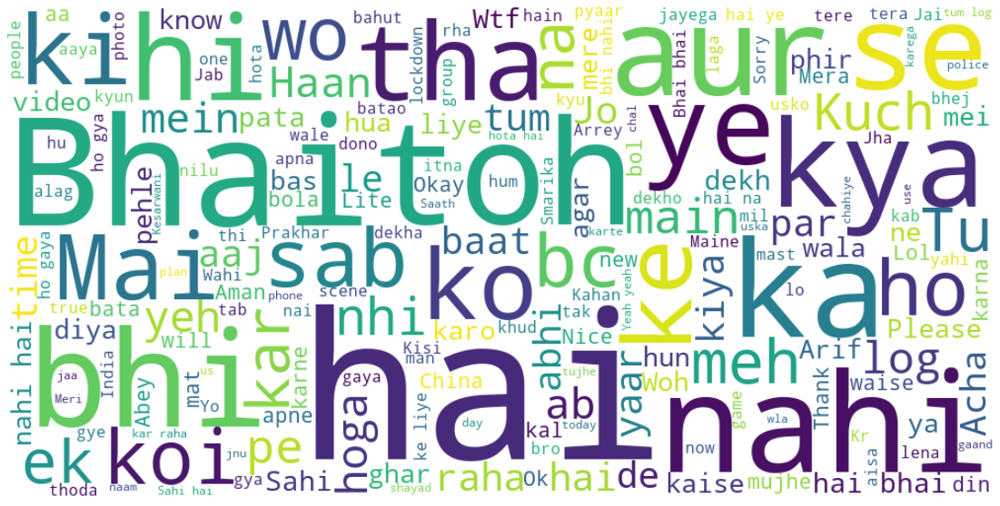

In [24]:
text = " ".join(review for review in messages_df.Message)
print ("There are {} words in all the messages.".format(len(text)))
stopwords = set(STOPWORDS)
# Generate a word cloud image
wordcloud = WordCloud(width=1000, height=500, stopwords=stopwords, background_color="white").generate(text)
# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig("images/wordcloud/overall")

Author name Prateek
Author name Gurjot
Author name Aarif
Author name Jai
Author name Smarika
Author name Abdul
Author name Agamya
Author name Utkarsh
Author name Subhankar
Author name Sarthak
Author name Niladri
Author name Aman
Author name Prakhar


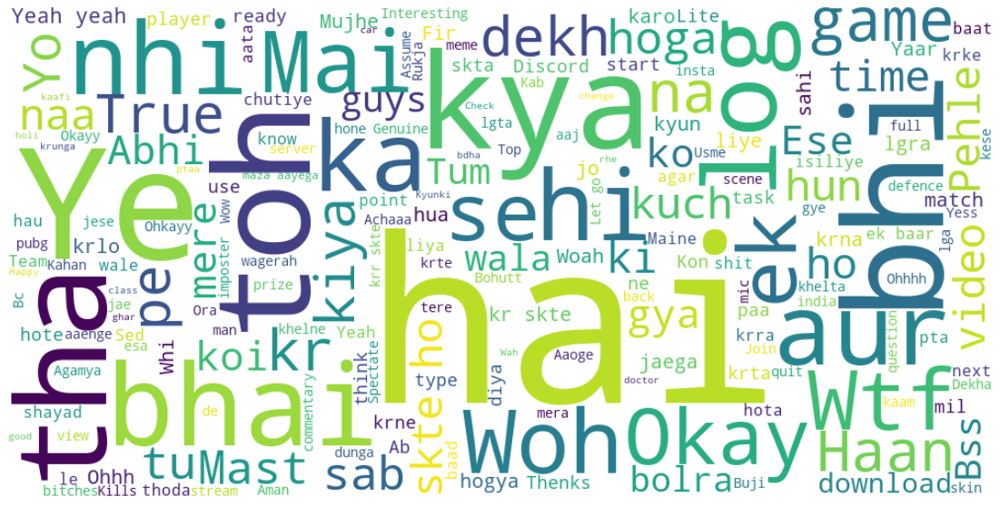

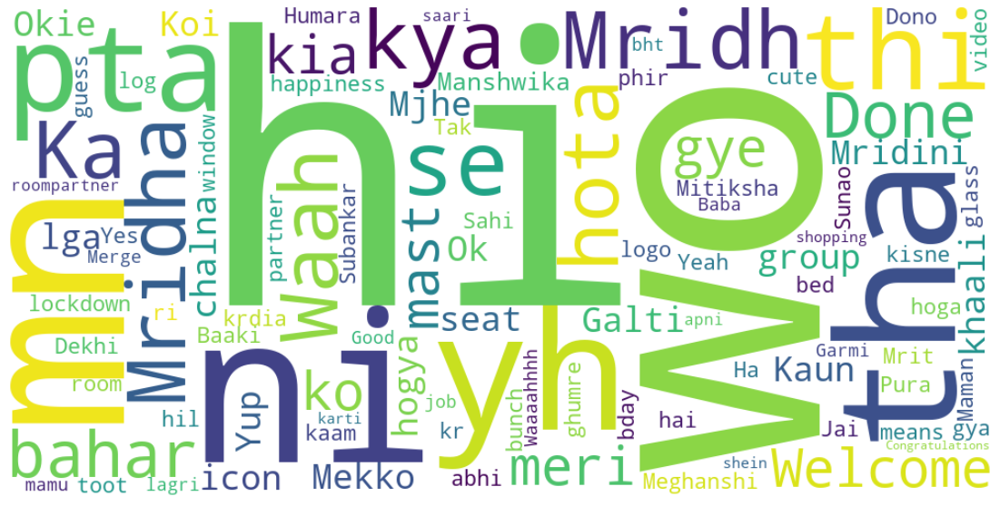

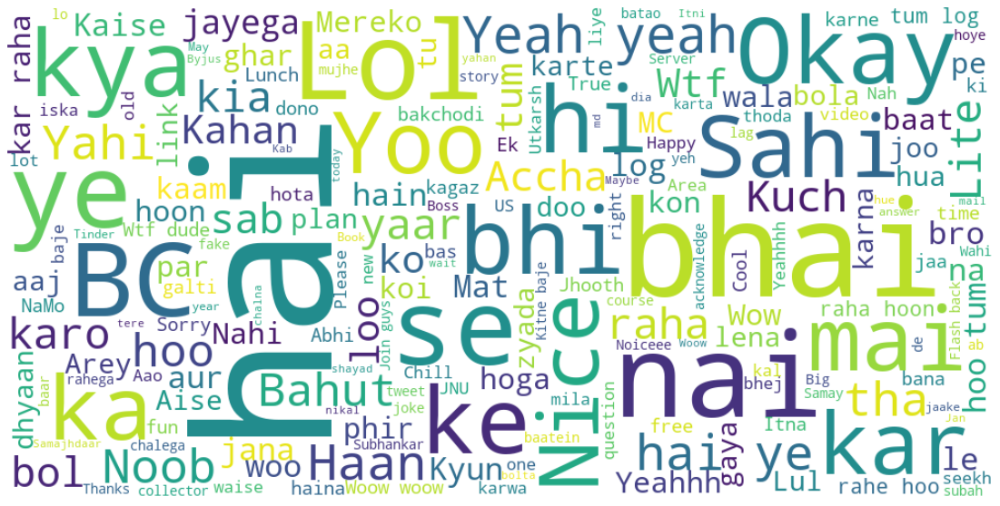

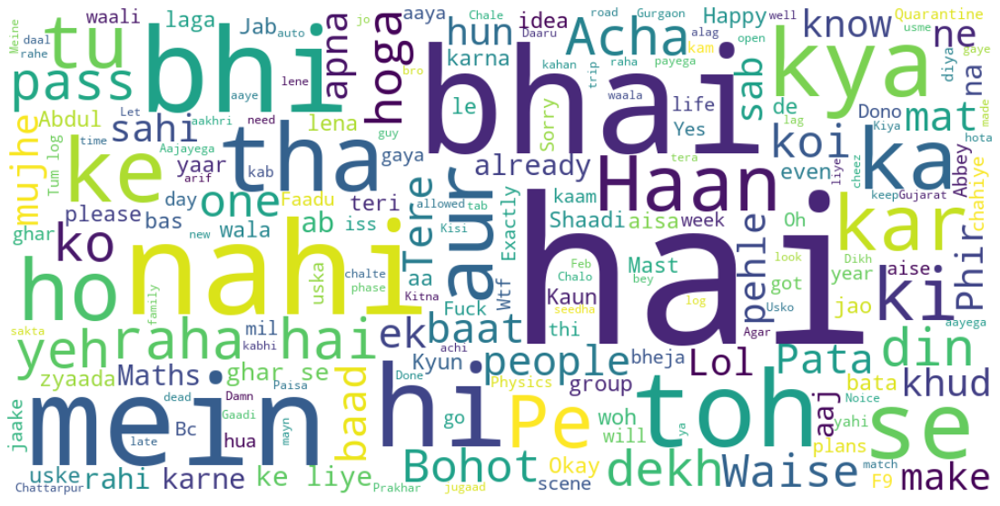

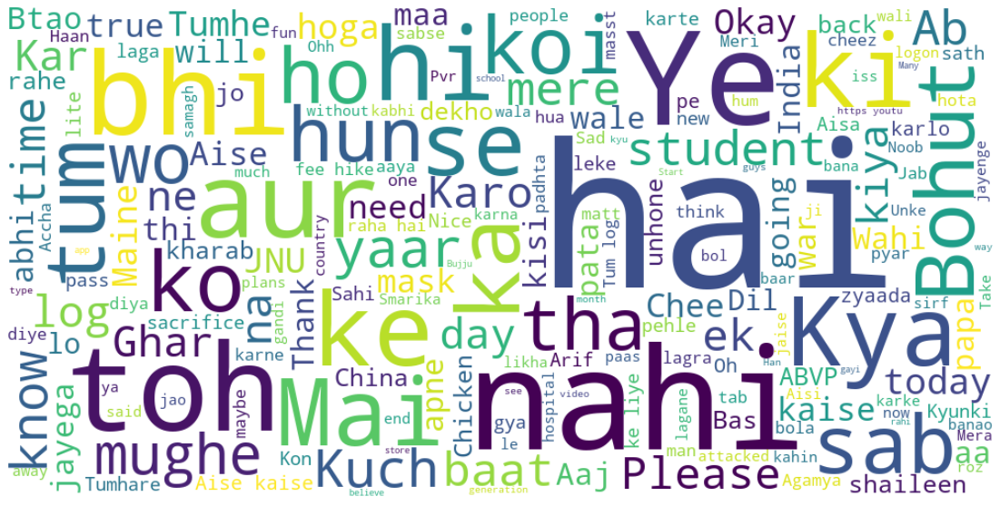

...

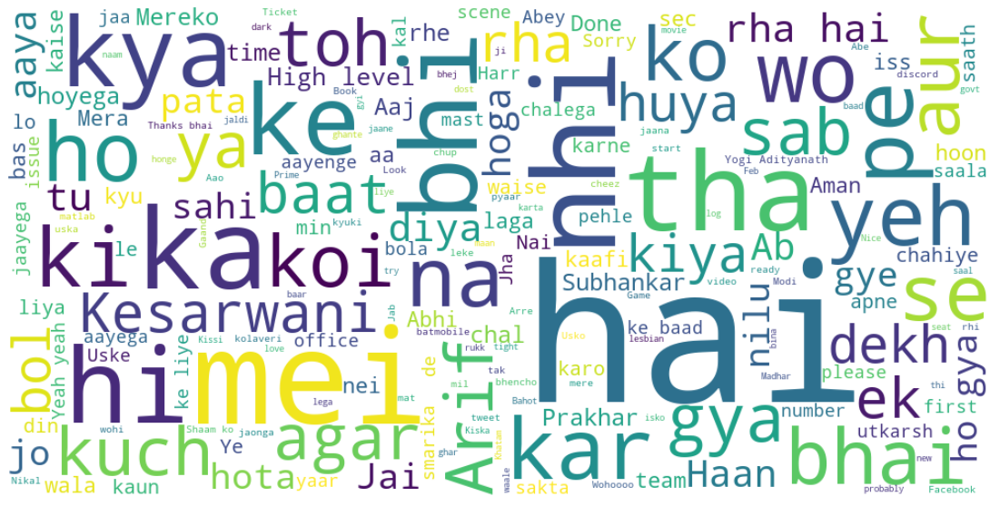

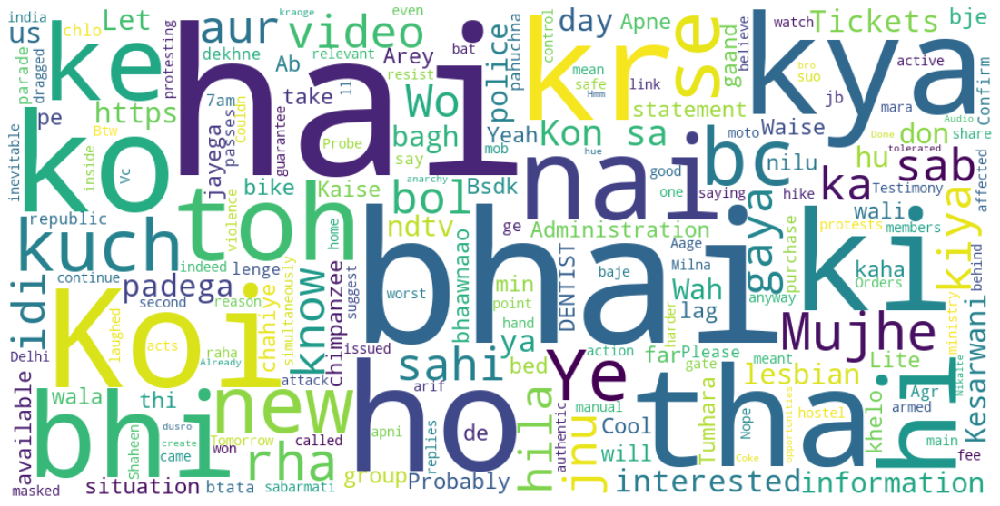

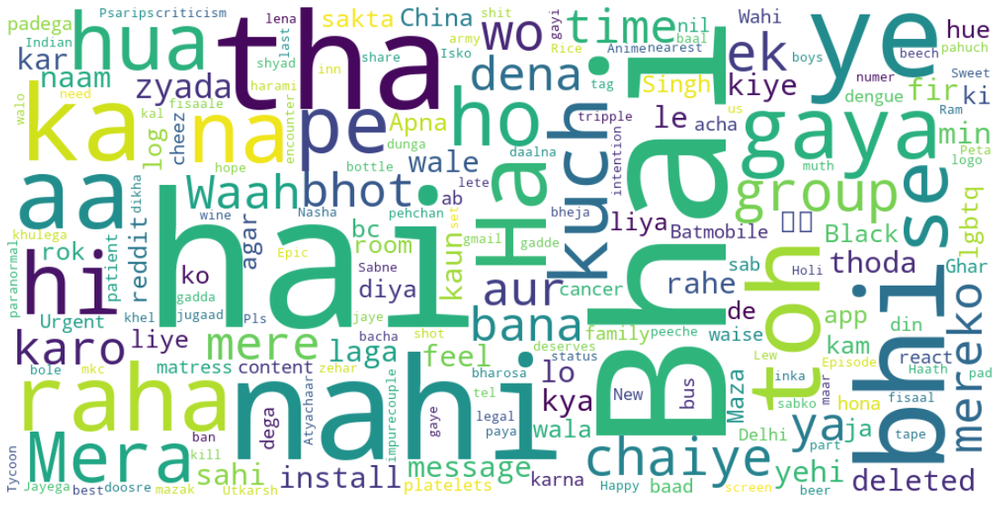

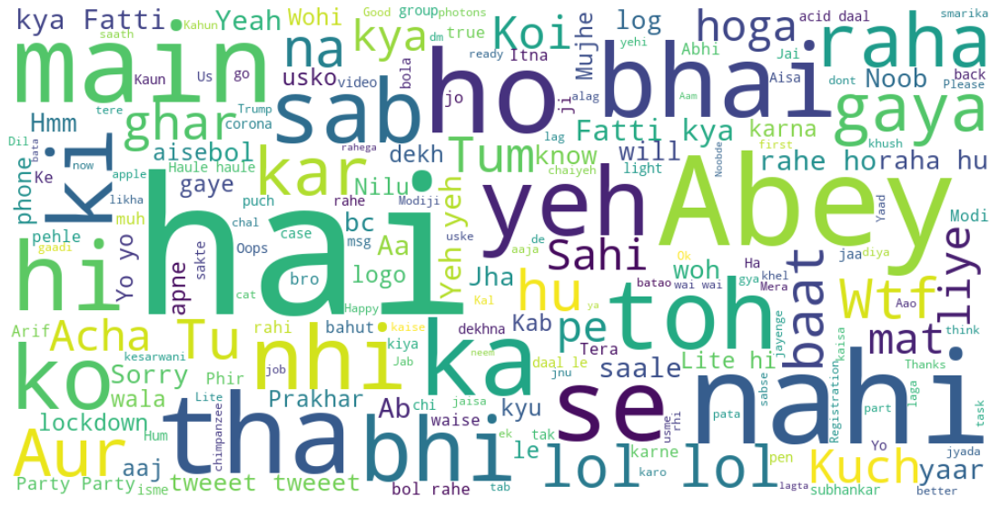

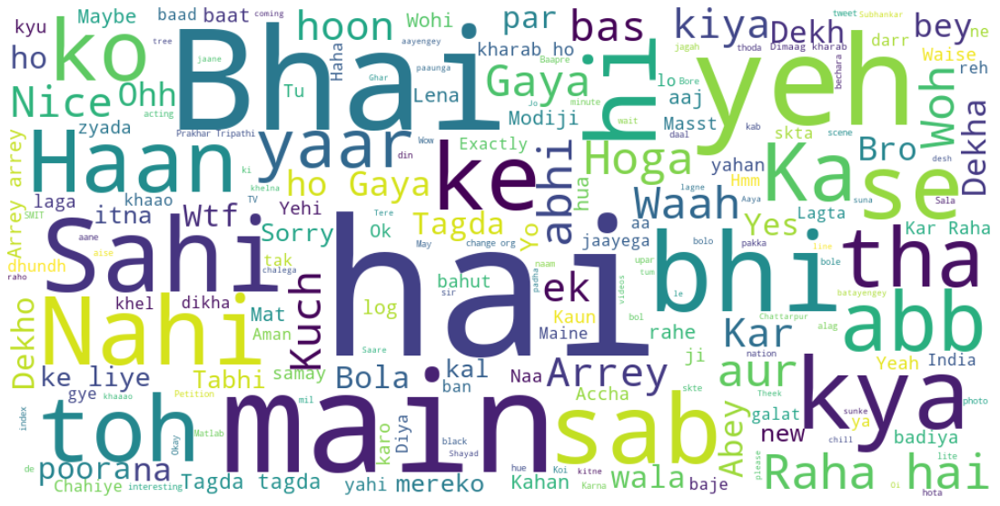

In [25]:
l = unique_names
for i in range(len(l)):
    dummy_df = messages_df[messages_df['Author'] == l[i]]
    text = " ".join(review for review in dummy_df.Message)
    stopwords = set(STOPWORDS)
    #Generate a word cloud image
    print('Author name',l[i])
    wordcloud = WordCloud(width=1000, height=500,stopwords=stopwords, background_color="white").generate(text)
    #Display the generated image   
    plt.figure( figsize=(20,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig("images/wordcloud/"+str(l[i]))

In [26]:
# save data sets
df.to_csv('data/base_data.csv', index=False)
df_data.to_csv('data/data.csv', index=False) 

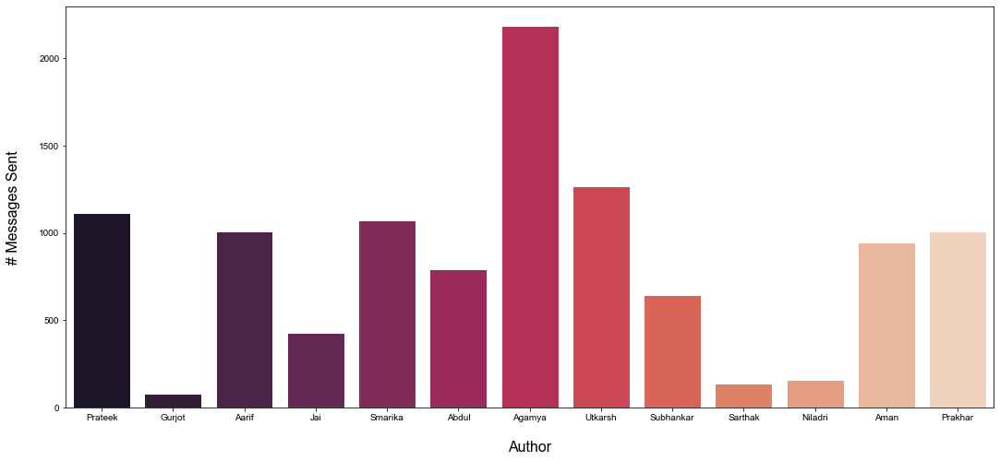

In [27]:
# bar plot -- author vs msg sent
fig, ax = plt.subplots(figsize=(18,8))
sns.set(font_scale=1.2)
sns.barplot(ax=ax ,x= df_data['author'],y=df_data['msg_sent'], palette='rocket')
plt.xlabel('Author', fontsize=16, labelpad=20)
plt.ylabel('# Messages Sent', fontsize=16, labelpad=20)
plt.savefig('images/plots/authorVSmsgSent.jpg')

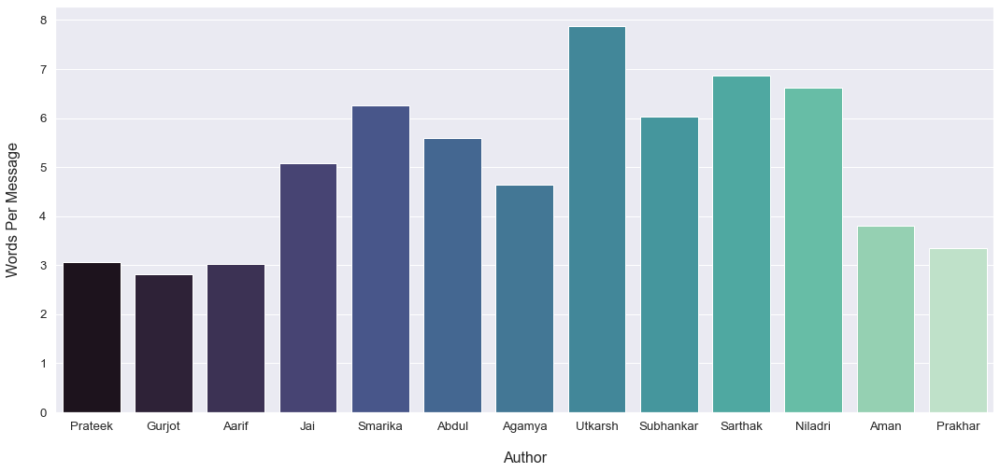

In [28]:
# bar plot -- author vs words per msg
fig, ax = plt.subplots(figsize=(18,8))
sns.set(font_scale=1.2)
sns.barplot(ax=ax ,x= df_data['author'],y=df_data['words_per_msg'], palette='mako')
plt.xlabel('Author', fontsize=16, labelpad=20)
plt.ylabel('Words Per Message', fontsize=16, labelpad=20)
plt.savefig('images/plots/authorVSwordsPerMsg.jpg')

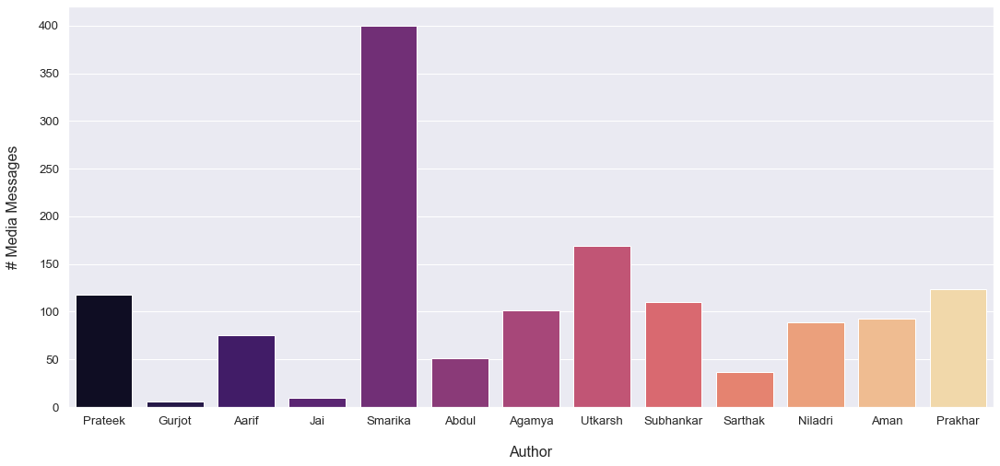

In [29]:
# bar plot -- author vs media msg
fig, ax = plt.subplots(figsize=(18,8))
sns.set(font_scale=1.2)
sns.barplot(ax=ax ,x= df_data['author'],y=df_data['media_msg'], palette='magma')
plt.xlabel('Author', fontsize=16, labelpad=20)
plt.ylabel('# Media Messages', fontsize=16, labelpad=20)
plt.savefig('images/plots/authorVSmediaMsg.jpg')

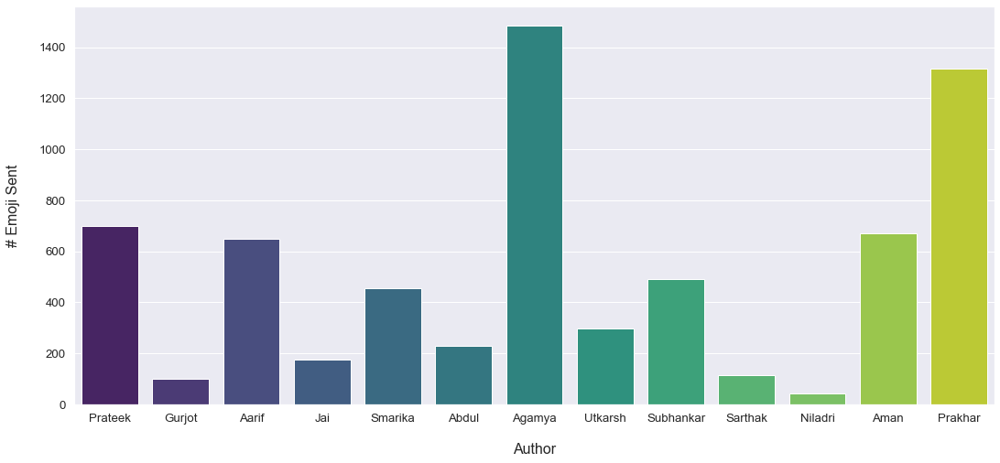

In [30]:
# bar plot -- author vs emoji sent
fig, ax = plt.subplots(figsize=(18,8))
sns.set(font_scale=1.2)
sns.barplot(ax=ax ,x= df_data['author'],y=df_data['emoji_sent'], palette='viridis')
plt.xlabel('Author', fontsize=16, labelpad=20)
plt.ylabel('# Emoji Sent', fontsize=16, labelpad=20)
plt.savefig('images/plots/authorVSemojiSent.jpg')

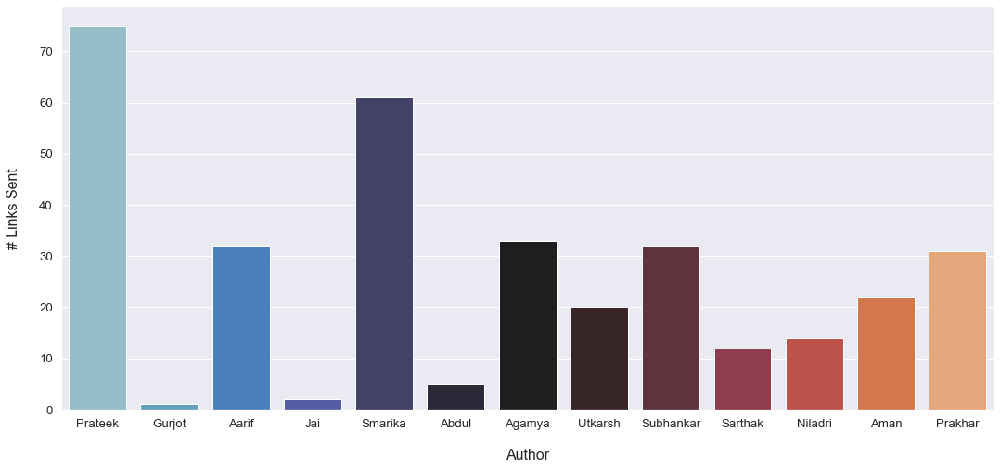

In [31]:
# bar plot -- author vs links sent
fig, ax = plt.subplots(figsize=(18,8))
sns.set(font_scale=1.2)
sns.barplot(ax=ax ,x= df_data['author'],y=df_data['links_sent'], palette='icefire')
plt.xlabel('Author', fontsize=16, labelpad=20)
plt.ylabel('# Links Sent', fontsize=16, labelpad=20)
plt.savefig('images/plots/authorVSlinksSent.jpg')

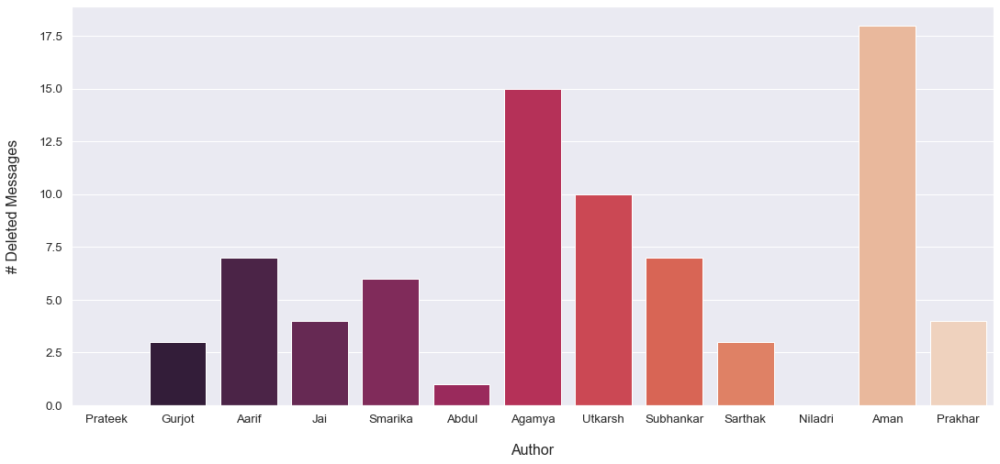

In [32]:
# bar plot -- author vs deleted messages
fig, ax = plt.subplots(figsize=(18,8))
sns.set(font_scale=1.2)
sns.barplot(ax=ax ,x= df_data['author'],y=df_data['deleted_msg'], palette='rocket')
plt.xlabel('Author', fontsize=16, labelpad=20)
plt.ylabel('# Deleted Messages', fontsize=16, labelpad=20)
plt.savefig('images/plots/authorVSdeletedMsg.jpg')

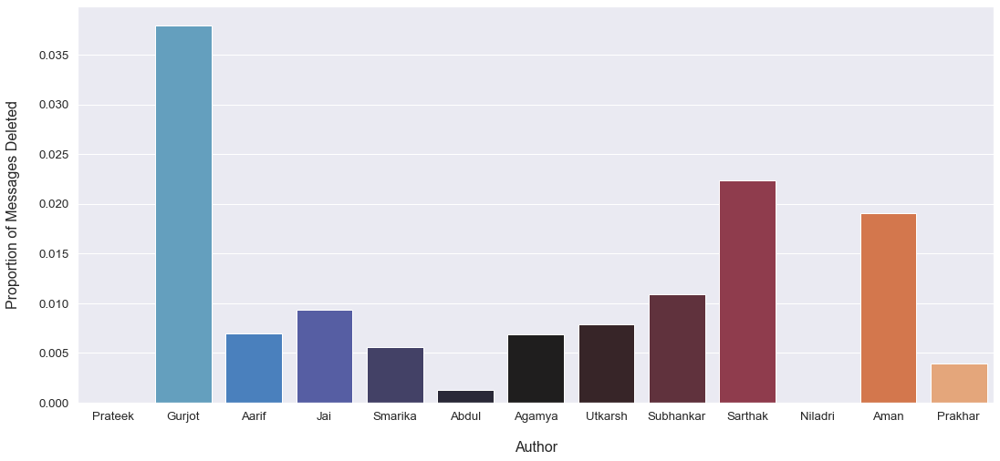

In [33]:
# bar plot -- author vs proportion of msg deleted
fig, ax = plt.subplots(figsize=(18,8))
sns.set(font_scale=1.2)
sns.barplot(ax=ax ,x= df_data['author'],y=df_data['del_prop'], palette='icefire')
plt.xlabel('Author', fontsize=16, labelpad=20)
plt.ylabel('Proportion of Messages Deleted', fontsize=16, labelpad=20)
plt.savefig('images/plots/authorVSpropDeleted.jpg')

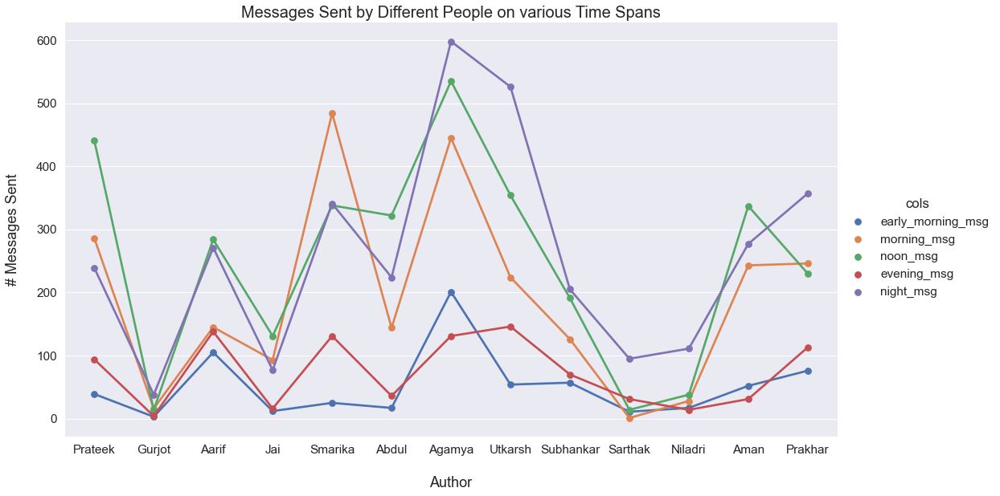

In [39]:
#Messages Sent by Different People on various Time Spans

df_comp = df_data.iloc[:, np.r_[0,6:11]]
df_comp = df_comp.melt('author', var_name='cols',  value_name='vals')
sns.set(font_scale=1.4)
sns.factorplot(x="author", y="vals", hue='cols', data=df_comp, size=8, aspect=1.8)
plt.xlabel('Author', fontsize=18, labelpad=25)
plt.ylabel('# Messages Sent', fontsize=18, labelpad=20)
plt.title('Messages Sent by Different People on various Time Spans', fontsize=20)
plt.savefig('images/plots/authorVSmsgSentByTime.jpg')

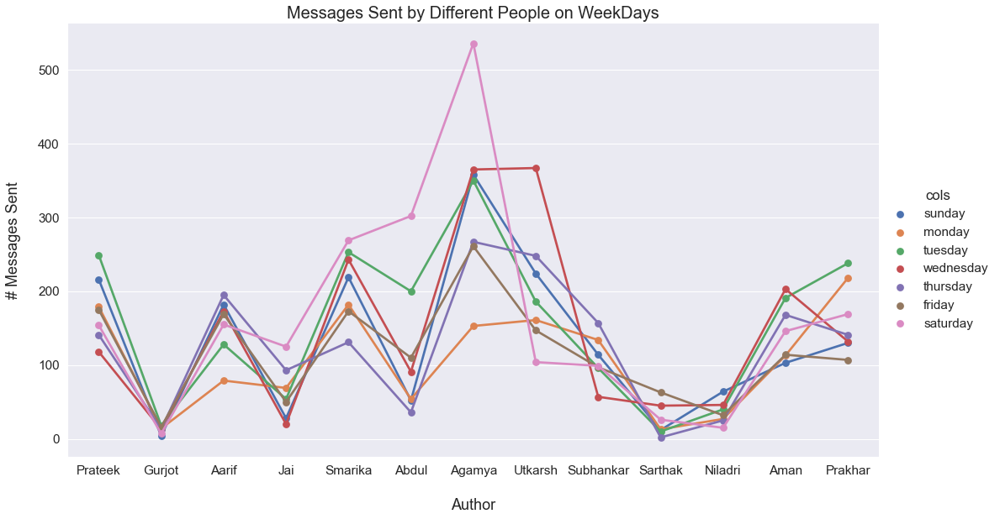

In [41]:
# Messages Sent by Different People on WeekDays

df_week = df_data.iloc[:, np.r_[0,11:18]]
df_week = df_week.melt('author', var_name='cols',  value_name='vals')
sns.set(font_scale=1.4)
sns.factorplot(x="author", y="vals", hue='cols', data=df_week, size=8, aspect=1.8)
plt.xlabel('Author', fontsize=18, labelpad=25)
plt.ylabel('# Messages Sent', fontsize=18, labelpad=20)
plt.title('Messages Sent by Different People on WeekDays', fontsize=20)
plt.savefig('images/plots/authorVSmsgSentByWeekDay.jpg')